In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  
)
from models.nnunet import nnUnet
from models.memory_unet import MemoryUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [2]:
args = {
    "base_path" : "./dataset/syntax/",
    "memory_unet":{
        "layer_count":4,
        "channel_max":256,
        "downsampling":"maxpool",
        "dropout" : False,
        "normaliztion":"InstanceNorm2d",#InstanceNorm2d
        "activation" : "LeakyReLU",
        "first_layer_out_c" : 32
    },
    "image_shape" : (448,448),
    "in_c":1,
    
    "training_mode":"binary",
    "report_class_wise":True,
    "attention" : False,
    "batch_size" : 8,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 1,
    "max_channels":512,
    "loss_type":"tversky",
    "output_base_path" : "./outputs",
    "name" : "binary-tests-model",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    ### Loss Functions
    "mask_ce_conf":{
        "imp_coef":1.0
    },
    "focal_ce_conf":{
        "gamma":2.0,
        "loss_scale":1.0,
        "imp_coef":1.0
    },
    "tversky_conf":{
        "alpha":0.9,
        "beta":0.1,
        "gamma":2.00,
        "weights":None,
        "imp_coef":1.0
    },
    "cl_dice_conf":{
        "imp_coef":1.0,
        "k":40
    },
    ### Optimizers
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
if(args["training_mode"] == "binary"):
    args["class_count"] = 2 
    class_map = {
        1:"fg"
    }

else:
    args["class_count"] = 26
    class_map = {
        1: '1',2: '2', 3: '3',4: '4',
        5: '5',6: '6',7:'9',8:'7',9:'9a',
        10:'10',11:'8',12:'10a',13:'12',14:'11',
        15:'12a',16:'12b',17:'13',18:'14',19:'14a',
        20:'14b',21:'15',22:'16',
        23: '16a',24: '16b',25: '16c',
    }

# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","mask CE-Loss",args["loss_type"],"cl dice loss"]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
if(args["training_mode"]!="binary"):
    b=0.999

    train_class_counts = [
        1200,374,375,369,303,525,537,
        198,340,70,21,310,1,61,320,129,
        63,305,107,49,127,38,232,43,48,31
    ]

    total = np.sum(train_class_counts)
    mask_ce_weights = np.log(total/np.array(train_class_counts))
    mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
    mask_ce_weights[0]=0.1

    args["mask_ce_weights"]=mask_ce_weights
    args["mask_ce_weights"]
else:
    args["mask_ce_weights"]=[0.1,1]

In [4]:
# args["t_alpha"] = [1,0.8]
args["tversky_conf"]["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    ]  
)

if(args["in_c"]==1):
    normalizer = normalize_xca
else:
    normalizer = A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
        max_pixel_value=255.0,
    )
train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:50: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:63: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(
    transform = train_transforms,
    data = train_images , 
    normalizer = normalizer,
    example_phase=False
)
valid_ds = TrainUnetDataset(
    transform = test_transforms,
    data = valid_images,
    normalizer = normalizer,
    example_phase=False
)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False
)


In [8]:

# model = nnUnet(args).to(args["device"])
model = MemoryUnet(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


encoder info : 
[1, 32, 64, 128, 256]
-----------------------
loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (0)
total loss : 1.3478977208137513 - mask CE-Loss : 0.41098397147655485 - tversky : 0.41239871180057525
cl dice loss : 0.5245150346755981 - 
train avg metrics for epoch 0 :
avg dice : 0.4358087480068207 - avg precision : 0.3392014801502228 - avg recall : 0.609359085559845
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 0.8943008279800415 - mask CE-Loss : 0.2983187055587769 - tversky : 0.23255874454975128
cl dice loss : 0.36342337608337405 - 
valid avg metrics for epoch 0 :
avg dice : 0.635399341583252 - avg precision : 0.5589531660079956 - avg recall : 0.7360691428184509
fg => dice : 0.635399341583252 p : 0.5589531660079956 , r : 0.7360691428184509
------------------------------------------------------------
New Best! : dice = 0.635399341583252


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (1)
total loss : 0.9850790872573852 - mask CE-Loss : 0.3298179751634598 - tversky : 0.25813703775405883
cl dice loss : 0.39712407112121584 - 
train avg metrics for epoch 1 :
avg dice : 0.601031482219696 - avg precision : 0.5335918068885803 - avg recall : 0.6879845261573792
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 0.8516176438331604 - mask CE-Loss : 0.2953700983524323 - tversky : 0.1933542162179947
cl dice loss : 0.3628933262825012 - 
valid avg metrics for epoch 1 :
avg dice : 0.6588876247406006 - avg precision : 0.621427059173584 - avg recall : 0.7011542916297913
fg => dice : 0.6588876247406006 p : 0.621427059173584 , r : 0.7011542916297913
------------------------------------------------------------
New Best! : dice = 0.6588876247406006


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 0.9270572772026062 - mask CE-Loss : 0.3129980118274689 - tversky : 0.2356838762164116
cl dice loss : 0.37837538623809813 - 
train avg metrics for epoch 2 :
avg dice : 0.6199228763580322 - avg precision : 0.5557563304901123 - avg recall : 0.7008405923843384
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 0.8606958985328674 - mask CE-Loss : 0.31058437705039976 - tversky : 0.1900277951359749
cl dice loss : 0.36008372068405153 - 
valid avg metrics for epoch 2 :
avg dice : 0.657727062702179 - avg precision : 0.6117428541183472 - avg recall : 0.7111862897872925
fg => dice : 0.657727062702179 p : 0.6117428541183472 , r : 0.7111862897872925
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 0.8804197273254395 - mask CE-Loss : 0.2986626055240631 - tversky : 0.21952754712104797
cl dice loss : 0.36222957611083983 - 
train avg metrics for epoch 3 :
avg dice : 0.6360100507736206 - avg precision : 0.5756641030311584 - avg recall : 0.7104895114898682
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 0.8130065059661865 - mask CE-Loss : 0.307703001499176 - tversky : 0.17079189389944077
cl dice loss : 0.3345116090774536 - 
valid avg metrics for epoch 3 :
avg dice : 0.668673038482666 - avg precision : 0.6237407922744751 - avg recall : 0.7205812931060791
fg => dice : 0.668673038482666 p : 0.6237407922744751 , r : 0.7205812931060791
------------------------------------------------------------
New Best! : dice = 0.668673038482666


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (4)
total loss : 0.8338548059463501 - mask CE-Loss : 0.28439118468761443 - tversky : 0.2064277281165123
cl dice loss : 0.3430358929634094 - 
train avg metrics for epoch 4 :
avg dice : 0.6474891304969788 - avg precision : 0.5836023092269897 - avg recall : 0.7270826697349548
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 0.7920233845710755 - mask CE-Loss : 0.29548028349876404 - tversky : 0.18304386347532273
cl dice loss : 0.3134992337226868 - 
valid avg metrics for epoch 4 :
avg dice : 0.6698839664459229 - avg precision : 0.5914627313613892 - avg recall : 0.7722793817520142
fg => dice : 0.6698839664459229 p : 0.5914627313613892 , r : 0.7722793817520142
------------------------------------------------------------
New Best! : dice = 0.6698839664459229


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (5)
total loss : 0.8203201303482056 - mask CE-Loss : 0.27809460073709485 - tversky : 0.20011549365520478
cl dice loss : 0.3421100363731384 - 
train avg metrics for epoch 5 :
avg dice : 0.653447687625885 - avg precision : 0.592679500579834 - avg recall : 0.7281007766723633
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 0.7406465578079223 - mask CE-Loss : 0.2593381780385971 - tversky : 0.16643990188837052
cl dice loss : 0.31486847877502444 - 
valid avg metrics for epoch 5 :
avg dice : 0.6872686743736267 - avg precision : 0.639515221118927 - avg recall : 0.7427293062210083
fg => dice : 0.6872686743736267 p : 0.639515221118927 , r : 0.7427293062210083
------------------------------------------------------------
New Best! : dice = 0.6872686743736267


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (6)
total loss : 0.783017792224884 - mask CE-Loss : 0.26183706575632093 - tversky : 0.191842620074749
cl dice loss : 0.3293381028175354 - 
train avg metrics for epoch 6 :
avg dice : 0.6652125716209412 - avg precision : 0.6047372221946716 - avg recall : 0.7391272783279419
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 0.6998873019218445 - mask CE-Loss : 0.2458207756280899 - tversky : 0.15204233467578887
cl dice loss : 0.3020241928100586 - 
valid avg metrics for epoch 6 :
avg dice : 0.7062951326370239 - avg precision : 0.658402681350708 - avg recall : 0.7617015242576599
fg => dice : 0.7062951326370239 p : 0.658402681350708 , r : 0.7617015242576599
------------------------------------------------------------
New Best! : dice = 0.7062951326370239


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (7)
total loss : 0.7632449011802673 - mask CE-Loss : 0.258783989071846 - tversky : 0.1831654809117317
cl dice loss : 0.3212954306602478 - 
train avg metrics for epoch 7 :
avg dice : 0.6732129454612732 - avg precision : 0.6129239201545715 - avg recall : 0.7466562986373901
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 0.7088228738307953 - mask CE-Loss : 0.2561863899230957 - tversky : 0.15777472615242005
cl dice loss : 0.29486176252365115 - 
valid avg metrics for epoch 7 :
avg dice : 0.6986080408096313 - avg precision : 0.6399971842765808 - avg recall : 0.7690362334251404
fg => dice : 0.6986080408096313 p : 0.6399971842765808 , r : 0.7690362334251404
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 0.7506358194351196 - mask CE-Loss : 0.25339681577682494 - tversky : 0.18008854055404663
cl dice loss : 0.31715046119689944 - 
train avg metrics for epoch 8 :
avg dice : 0.676176130771637 - avg precision : 0.61762535572052 - avg recall : 0.7469907402992249
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 0.6764135789871216 - mask CE-Loss : 0.23728700399398803 - tversky : 0.14459510207176207
cl dice loss : 0.29453147172927857 - 
valid avg metrics for epoch 8 :
avg dice : 0.7137401700019836 - avg precision : 0.6794280409812927 - avg recall : 0.7517022490501404
fg => dice : 0.7137401700019836 p : 0.6794280409812927 , r : 0.7517022490501404
------------------------------------------------------------
New Best! : dice = 0.7137401700019836


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (9)
total loss : 0.7311398317813873 - mask CE-Loss : 0.24833518123626708 - tversky : 0.17198783528804779
cl dice loss : 0.31081681442260745 - 
train avg metrics for epoch 9 :
avg dice : 0.6844006776809692 - avg precision : 0.6293831467628479 - avg recall : 0.749958336353302
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 0.695127694606781 - mask CE-Loss : 0.22062394499778748 - tversky : 0.18844722151756288
cl dice loss : 0.2860565209388733 - 
valid avg metrics for epoch 9 :
avg dice : 0.6910443305969238 - avg precision : 0.5916317105293274 - avg recall : 0.8306133151054382
fg => dice : 0.6910443305969238 p : 0.5916317105293274 , r : 0.8306133151054382
------------------------------------------------------------
best result at epoch 9 with dice 0.7137401700019836


Save Model
Saving Memory
Saving All Plots


  0%|          | 0/25 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 12/12 [00:00<00:00, 2531.01it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./models/conv_lstm.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


processing ./temp_script.py


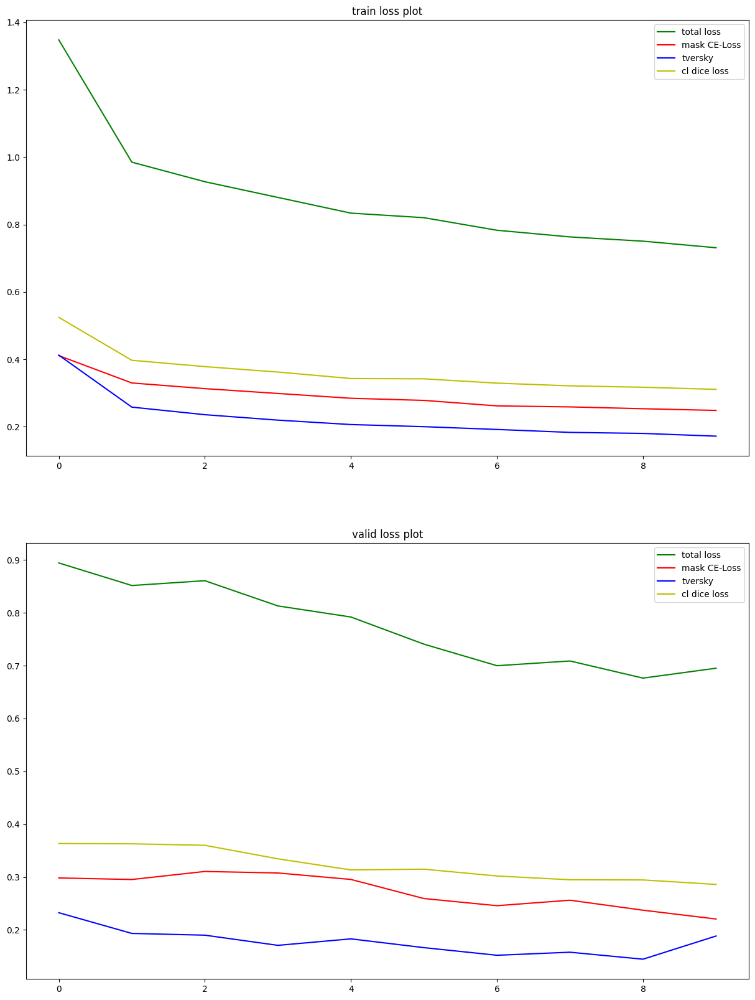

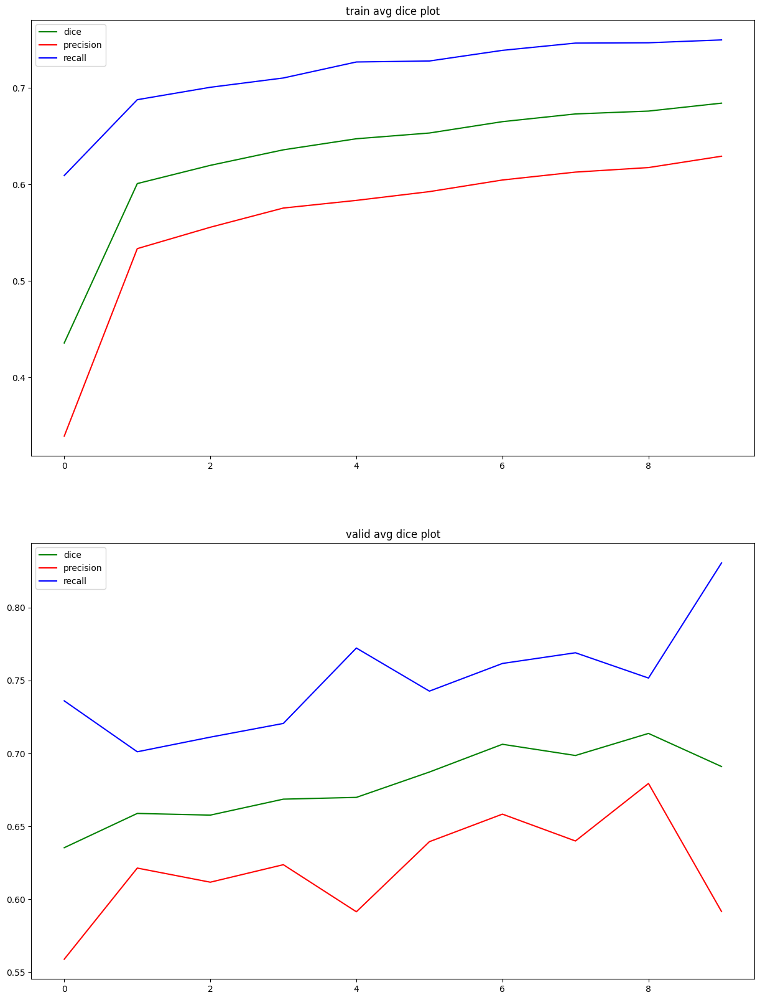

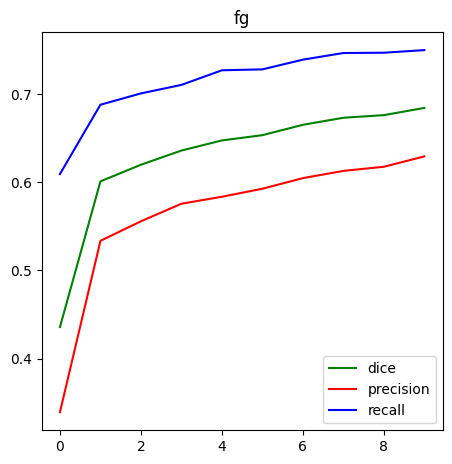

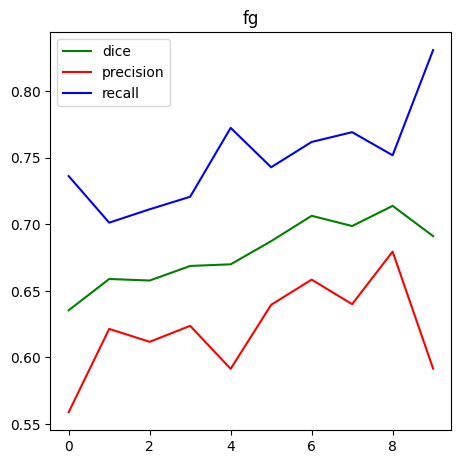

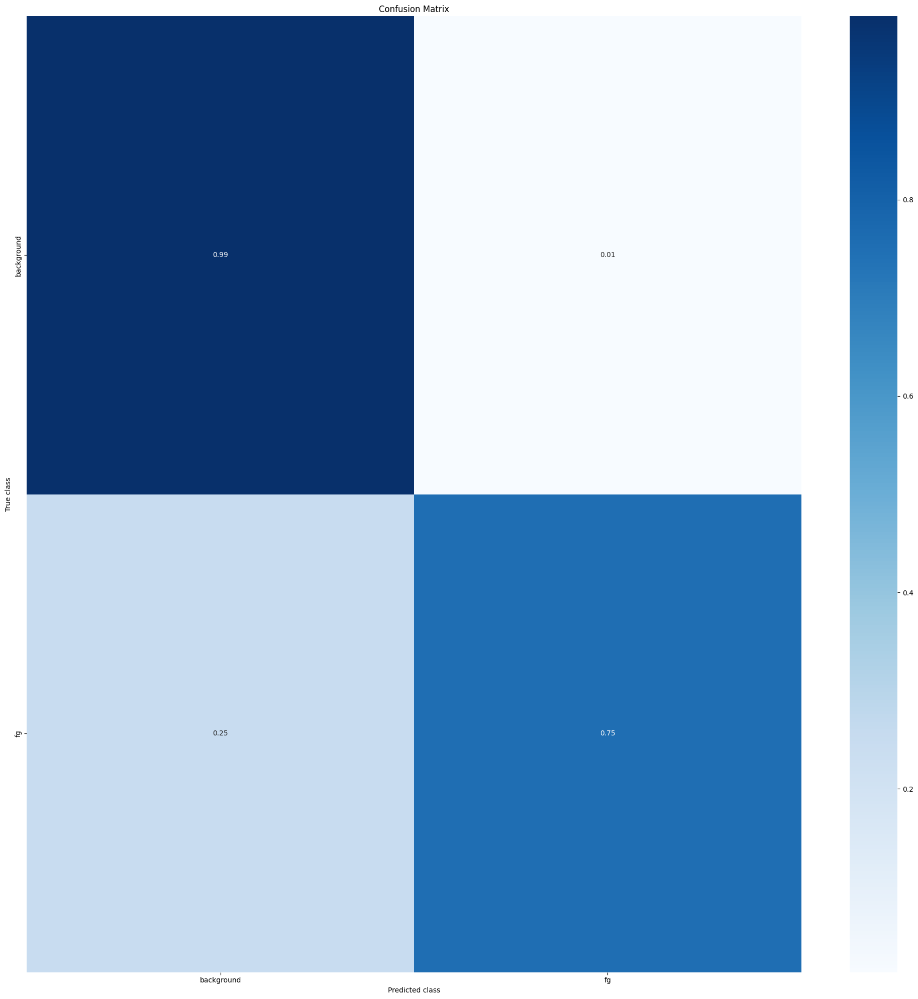

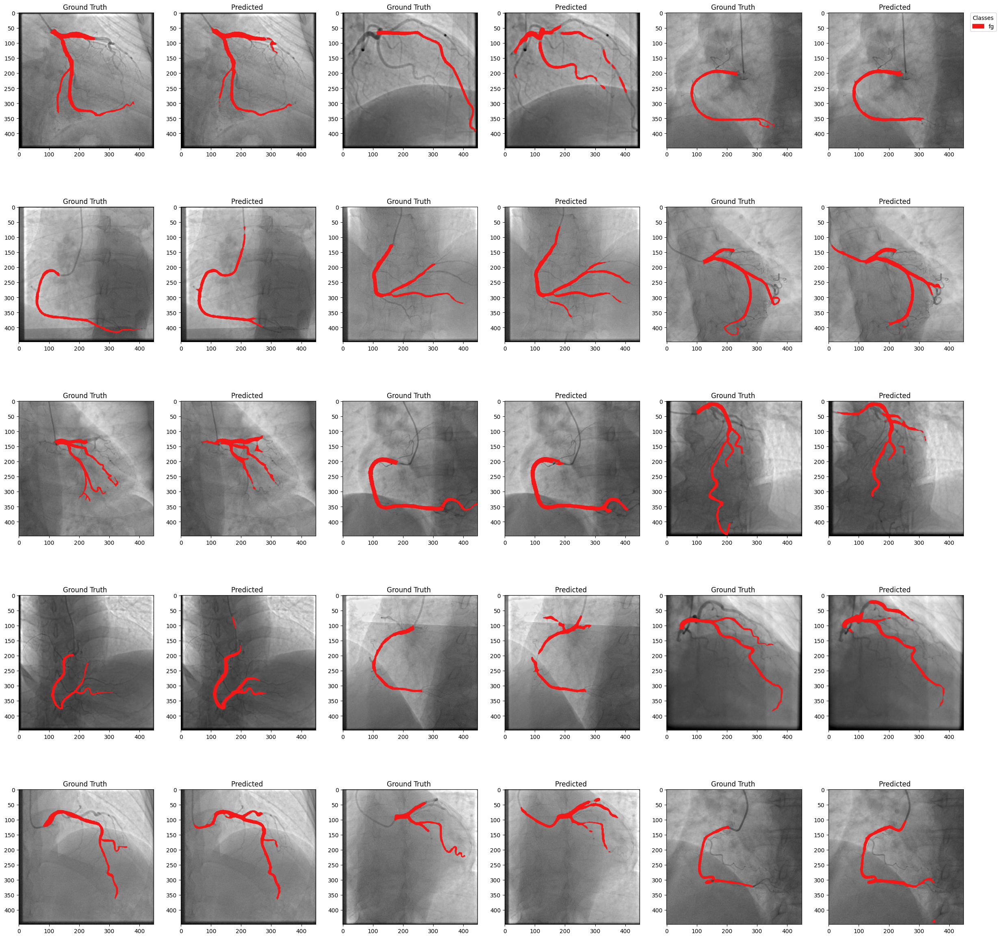

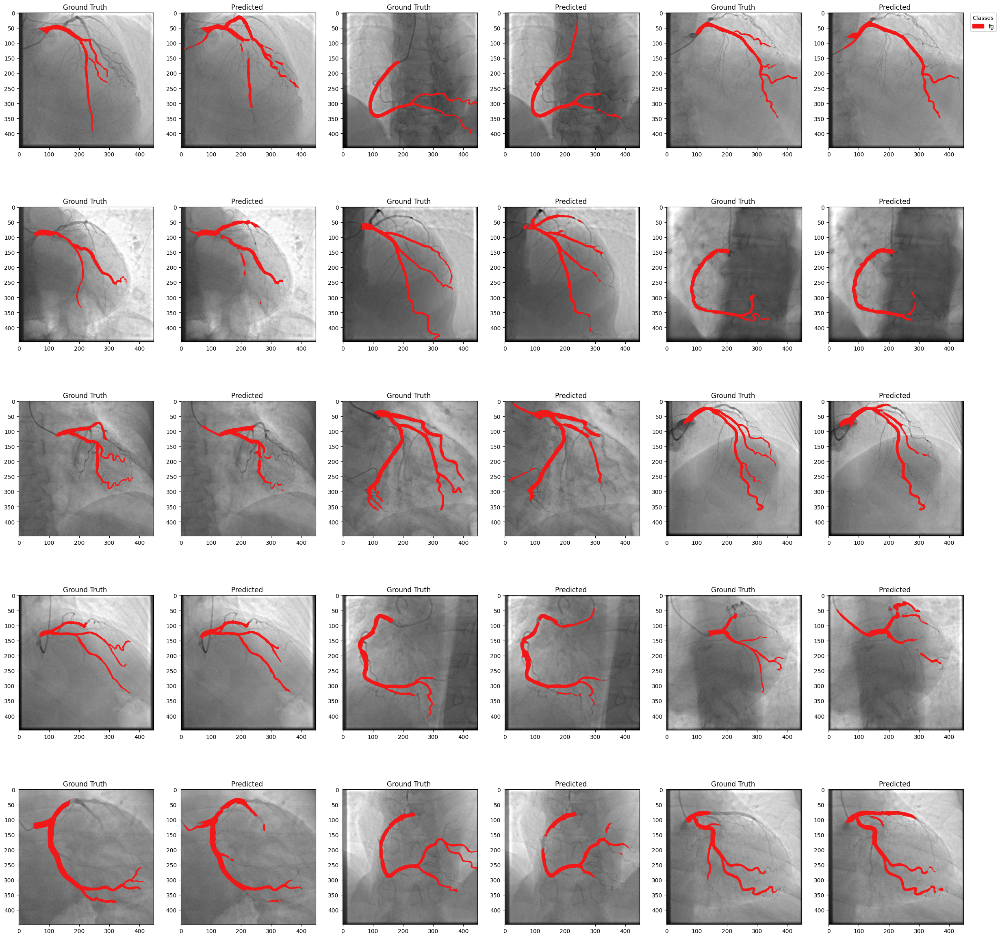

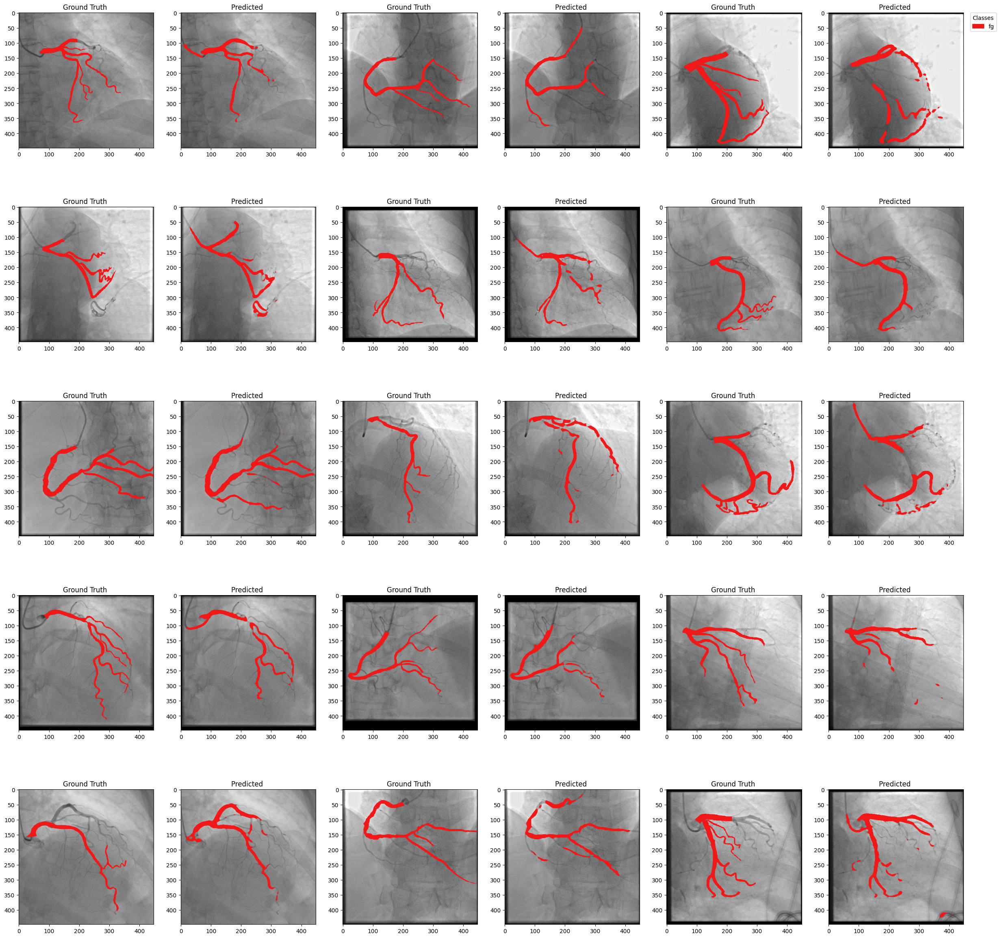

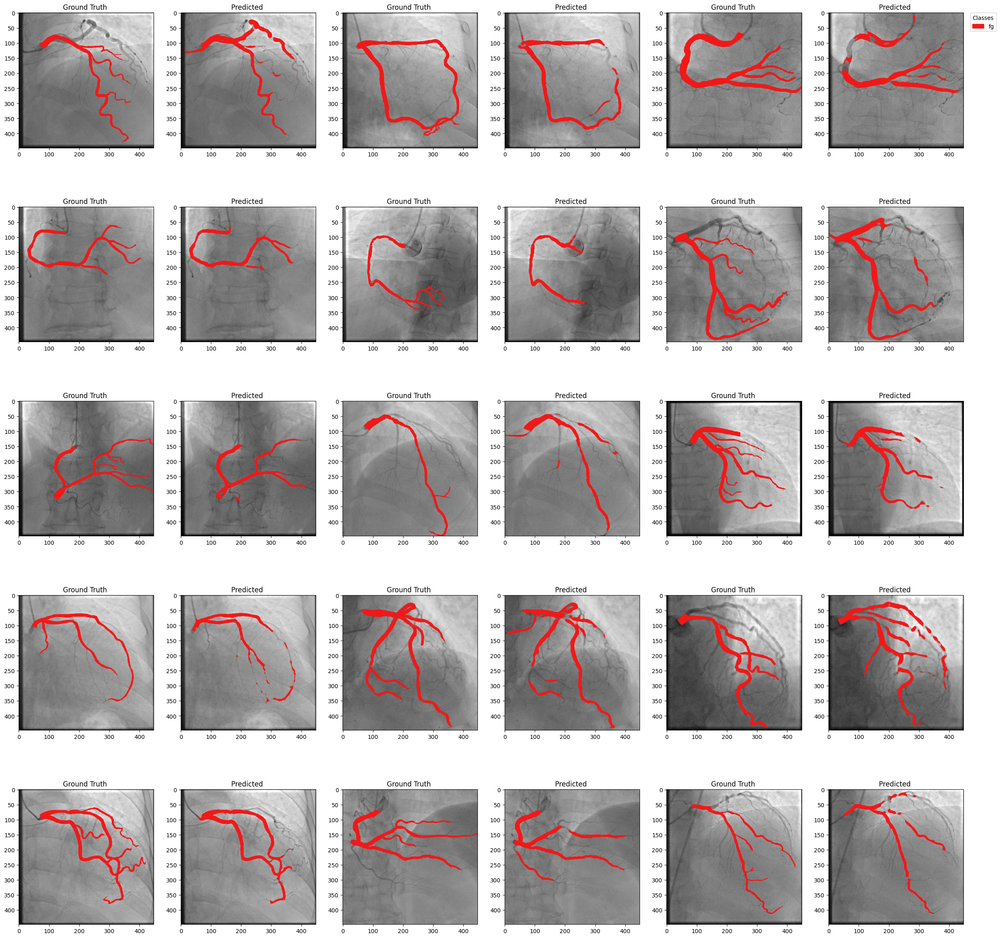

In [9]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    normalizer = normalizer,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"],
    training_mode = args["training_mode"]
)